In [1]:
from icevision.all import *

/root/miniforge-pypy3/envs/icevision/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


## Load Annotations

In [2]:
parser = parsers.VOCBBoxParser(annotations_dir='pascal_voc_annotations/', 
                               images_dir='/workspace/yolo_v8_training/oiv7_full/validation/')

In [3]:
# Parse annotations to create records
train_records, valid_records = parser.parse() # Defaults to 80:20 split
parser.class_map

  0%|          | 0/904 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/904 [00:00<?, ?it/s]

<ClassMap: {'background': 0, 'person': 1}>

In [4]:
image_size = 480
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=640), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [5]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [6]:
print(f"Train on {len(train_ds)} images")
print(f"Validate on {len(valid_ds)} images")

Train on 723 images
Validate on 181 images


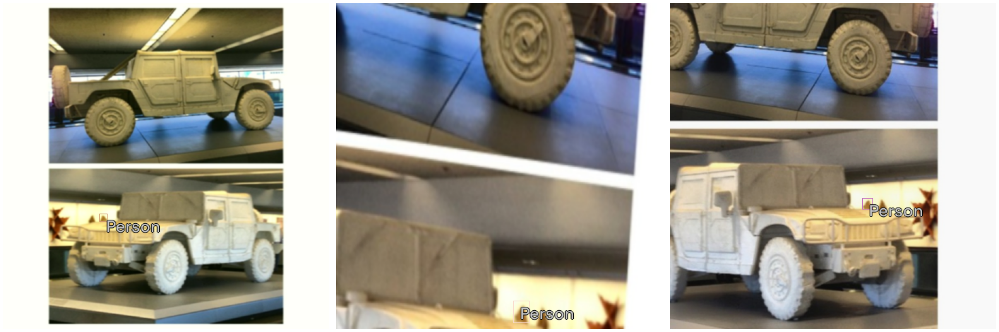

In [7]:
%matplotlib inline
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

## Build Model

In [8]:
model_type = models.mmdet.vfnet
backbone = model_type.backbones.resnet50_fpn_mstrain_2x
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map)) 

2024-03-28 11:06:05,633 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2024-03-28 11:06:05,634 - mmcv - INFO - load model from: torchvision://resnet50
2024-03-28 11:06:05,635 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2024-03-28 11:06:05,910 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2024-03-28 11:06:05,920 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2024-03-28 11:06:05,948 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'vfnet_cls', 'std': 0.01, 'bias_prob': 0.01}}
2024-03-28 11:06:05,984 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2024-03-28 11:06:05,984 - mmcv - INFO -

load checkpoint from local path: checkpoints/vfnet/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.vfnet_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([1, 256, 3, 3]).
size mismatch for bbox_head.vfnet_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([1]).


In [9]:
train_dl = model_type.train_dl(train_ds, batch_size=32, num_workers=16, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=32, num_workers=16, shuffle=False)

In [10]:
# model_type.show_batch(first(valid_dl), ncols=4)

In [11]:
from fastai.callback.tracker import SaveModelCallback, ShowGraphCallback

In [12]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], 
                                  model=model, 
                                  metrics=metrics,
                                  cbs=[ShowGraphCallback()])

/root/miniforge-pypy3/envs/icevision/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


SuggestedLRs(valley=0.00019054606673307717)

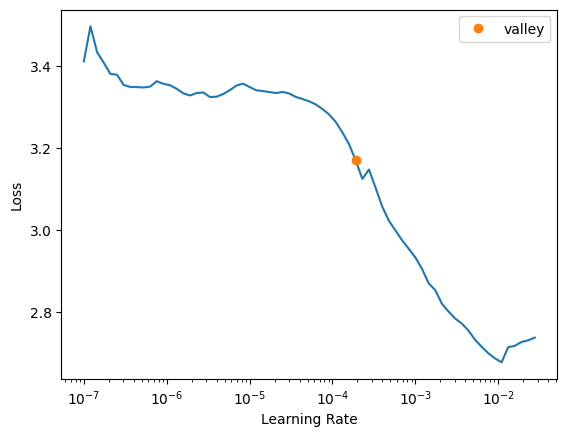

In [13]:
learn.lr_find()

epoch,train_loss,valid_loss,COCOMetric,time
0,2.385272,2.873926,0.015842,00:18


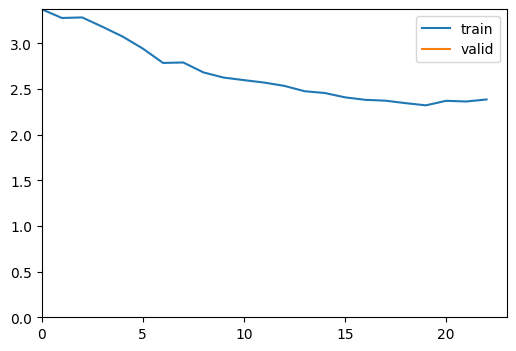

epoch,train_loss,valid_loss,COCOMetric,time
0,1.863951,1.573058,0.287190,00:20
1,1.897253,2.050255,0.210967,00:20
2,1.825149,1.552332,0.298985,00:21
3,1.708795,1.487238,0.344053,00:20
4,1.618799,1.464113,0.343877,00:21


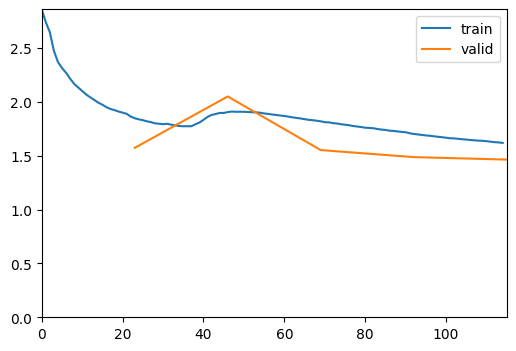

In [14]:
learn.fine_tune(5, 3e-3, freeze_epochs=1)

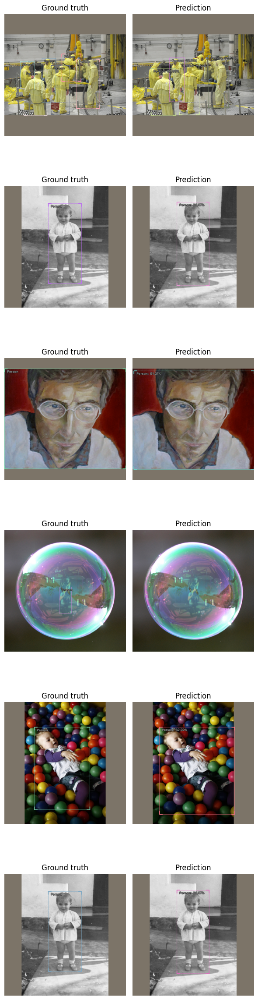

In [15]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

INFO     - Losses returned by model: ['loss_cls', 'loss_bbox'] | icevision.models.interpretation:plot_top_losses:219


  0%|          | 0/181 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

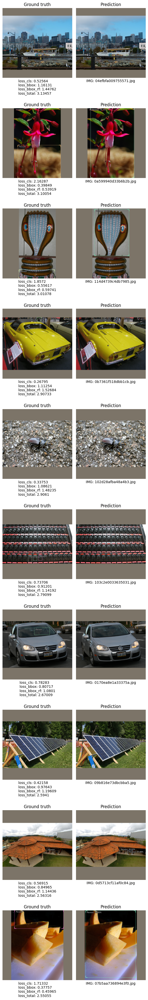

In [16]:
sorted_samples, sorted_preds, losses_stats = model_type.interp.plot_top_losses(model, valid_ds, sort_by="loss_total", n_samples=10, batch_size=32)

In [51]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=8)
preds = model_type.predict_from_dl(model=model, infer_dl=infer_dl, keep_images=True)

  0%|          | 0/23 [00:00<?, ?it/s]

In [52]:
len(preds)

181

In [53]:
from icevision.models.checkpoint import *
save_icevision_checkpoint(model,
                        model_name='mmdet.vfnet', 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        img_size=640,
                        classes=parser.class_map.get_classes(),
                        filename='./models/model_checkpoint.pth',
                        meta={'icevision_version': 'master'})

In [54]:
preds[0].as_dict()

{'common': {'width': 480,
  'height': 480,
  'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.00

In [210]:
def convert_preds_format(detection_output):
    num_classes = 2
    converted_output = [np.empty((0, 5), dtype=np.float32) for _ in range(num_classes)]
    
    for label_id, score, bbox in zip(detection_output['detection']['label_ids'],
                                     detection_output['detection']['scores'],
                                     detection_output['detection']['bboxes']):
        # Extract bounding box coordinates
        xmin, ymin, xmax, ymax = bbox.xmin, bbox.ymin, bbox.xmax, bbox.ymax
        
        # Append detection to the corresponding class index
        converted_output[label_id] = np.append(converted_output[label_id], [[xmin, ymin, xmax, ymax, score]], axis=0)
    
    return converted_output

In [211]:
convert_preds_format(preds[0].as_dict())

[array([], shape=(0, 5), dtype=float32),
 array([[        166,       122.9,      301.12,       470.5,     0.92985]], dtype=float32)]

In [212]:
preds[0].ground_truth.as_dict()

{'common': {'width': 480,
  'height': 480,
  'filepath': Path('/workspace/yolo_v8_training/oiv7_full/validation/0b3b8bb30662c22a.jpg'),
  'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   

In [241]:
import numpy as np

def convert_gt_format(data):
    # Extract necessary information from the original format
    bboxes = []
    labels = []
    for detection in data['detection']['bboxes']:
        bboxes.append([detection.xmin, detection.ymin, detection.xmax, detection.ymax])
    labels = data['detection']['label_ids']
    
    seg_map = str(data['common']['filepath']).split('/')[-1]
    filepath = str(data['common']['filepath'])
    img = data['common']['img']
    
    # Create the converted format
    converted_data = {
        'bboxes': np.array(bboxes, dtype=np.float32),
        'labels': np.array(labels),
        'bboxes_ignore': np.empty(shape=(0, 4), dtype=np.float32),
        'masks': [],
        'seg_map': seg_map,
        'filepath': filepath,
        'img': img
    }
    
    return converted_data

In [242]:
convert_gt_format(preds[0].ground_truth.as_dict())

{'bboxes': array([[     168.63,      126.56,      298.17,      474.84]], dtype=float32),
 'labels': array([1]),
 'bboxes_ignore': array([], shape=(0, 4), dtype=float32),
 'masks': [],
 'seg_map': '0b3b8bb30662c22a.jpg',
 'filepath': '/workspace/yolo_v8_training/oiv7_full/validation/0b3b8bb30662c22a.jpg',
 'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917]],
 
        [[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917]],
 
        [[  0.0055655,  -0.0049019,   0.0081917],
   

In [243]:
label = convert_gt_format(preds[0].ground_truth.as_dict())

with open('label.pkl', 'wb') as f:
    pickle.dump(label, f)

In [244]:
predictions = []
labels = []

# Convert preds and gt into a list

for pred in preds:
    p = pred.as_dict()

    p = convert_preds_format(p)


    l = pred.ground_truth.as_dict()
    l = convert_gt_format(l)

    predictions.append(p)
    labels.append(l)



In [245]:
len(labels)

181

In [246]:
len(predictions)

181

In [247]:
predictions[0]

[array([], shape=(0, 5), dtype=float32),
 array([[        166,       122.9,      301.12,       470.5,     0.92985]], dtype=float32)]

In [248]:
labels[0]

{'bboxes': array([[     168.63,      126.56,      298.17,      474.84]], dtype=float32),
 'labels': array([1]),
 'bboxes_ignore': array([], shape=(0, 4), dtype=float32),
 'masks': [],
 'seg_map': '0b3b8bb30662c22a.jpg',
 'filepath': '/workspace/yolo_v8_training/oiv7_full/validation/0b3b8bb30662c22a.jpg',
 'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917]],
 
        [[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917]],
 
        [[  0.0055655,  -0.0049019,   0.0081917],
   

In [249]:
from cleanlab.object_detection.filter import find_label_issues
from cleanlab.object_detection.rank import (
    _separate_label,
    _separate_prediction,
    get_label_quality_scores,
    issues_from_scores,
)
from cleanlab.object_detection.summary import visualize

label_issue_idx = find_label_issues(labels, predictions, return_indices_ranked_by_score=True)

num_examples_to_show = 10
label_issue_idx[:num_examples_to_show]

Pruning 0 predictions out of 157 using threshold==0.0. These predictions are no longer considered as potential candidates for identifying label issues as their similarity with the given labels is no longer considered.


array([ 46,  32, 147, 139,  66, 165,  16,  52,  70,  11])

In [250]:
scores = get_label_quality_scores(labels, predictions)
scores[:num_examples_to_show]

issue_idx = issues_from_scores(scores, threshold=0.5)  # lower threshold will return fewer (but more confident) label issues
issue_idx[:num_examples_to_show], scores[issue_idx][:num_examples_to_show]

Pruning 0 predictions out of 157 using threshold==0.0. These predictions are no longer considered as potential candidates for identifying label issues as their similarity with the given labels is no longer considered.


(array([ 46,  32, 147, 139,  66, 165,  16,  52,  70,  11]),
 array([    0.12638,     0.14609,     0.16644,     0.20263,     0.22082,     0.27899,     0.29688,     0.30245,     0.32499,     0.33816]))

/workspace/yolo_v8_training/oiv7_full/validation/0ee131f55fb5b7f2.jpg | idx 165 | label quality score: 0.2789872559308131 | is issue: True


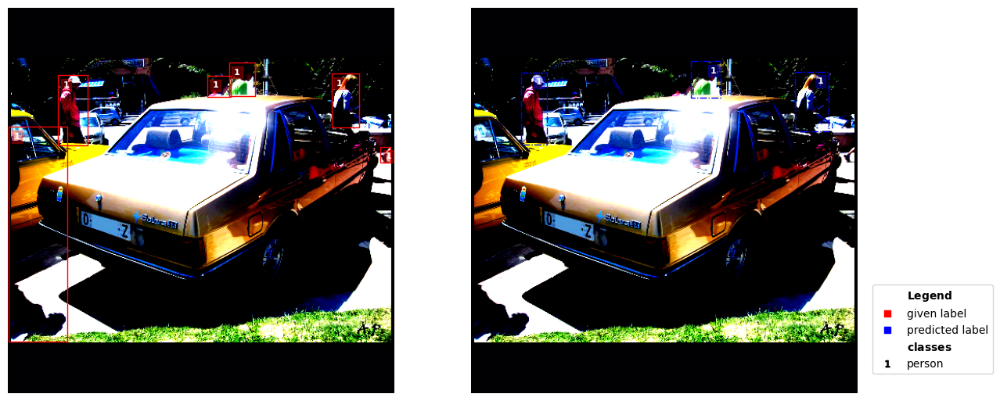

In [260]:
issue_to_visualize = issue_idx[5]  # change this to view other images
class_names = {"1": "person"}

IMAGE_PATH =  '/workspace/yolo_v8_training/oiv7_full/validation/'

label = labels[issue_to_visualize]
prediction = predictions[issue_to_visualize]
score = scores[issue_to_visualize]
image_path = IMAGE_PATH + label['seg_map']

print(image_path, '| idx', issue_to_visualize , '| label quality score:', score, '| is issue: True')
visualize(label['img'], label=label, prediction=prediction, class_names=class_names, overlay=False)

/workspace/yolo_v8_training/oiv7_full/validation/0ab10a6417ef2301.jpg | idx 46 | label quality score: 0.12637594573727912 | is issue: True


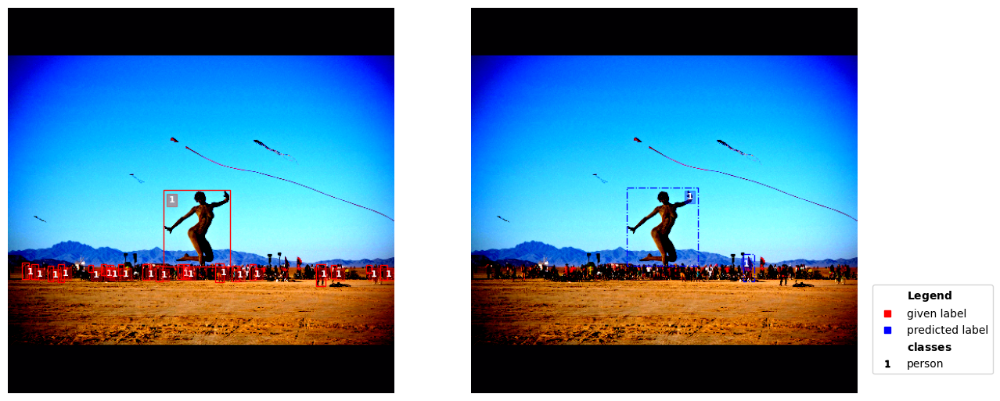

/workspace/yolo_v8_training/oiv7_full/validation/035c04d0993f489f.jpg | idx 32 | label quality score: 0.14609399339195414 | is issue: True


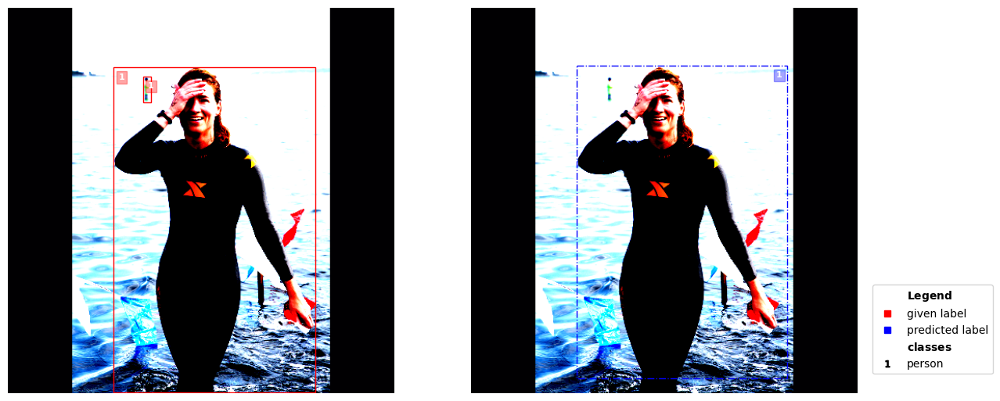

/workspace/yolo_v8_training/oiv7_full/validation/0acfa779589204bf.jpg | idx 147 | label quality score: 0.1664441324373589 | is issue: True


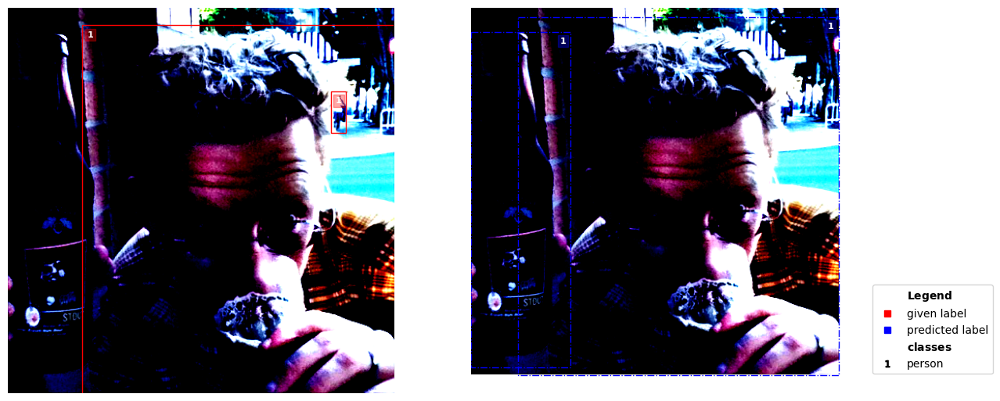

/workspace/yolo_v8_training/oiv7_full/validation/06294ef356d77e7e.jpg | idx 139 | label quality score: 0.20263174339311965 | is issue: True


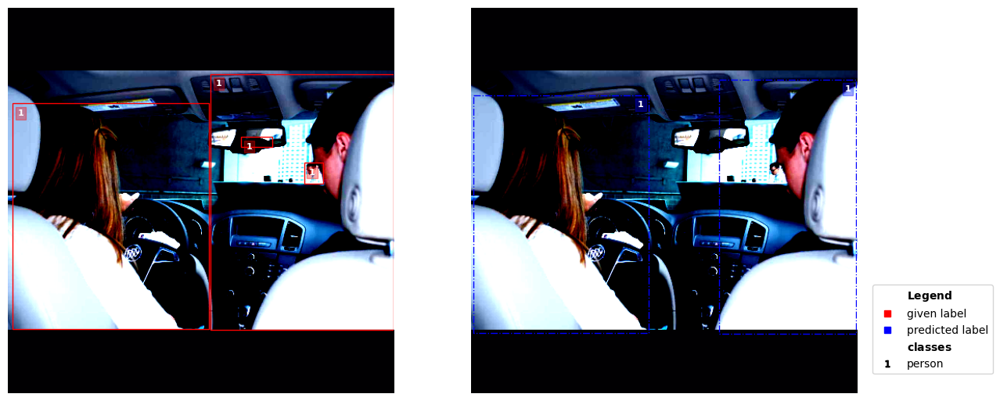

/workspace/yolo_v8_training/oiv7_full/validation/02c94402476ac94c.jpg | idx 66 | label quality score: 0.2208231312552851 | is issue: True


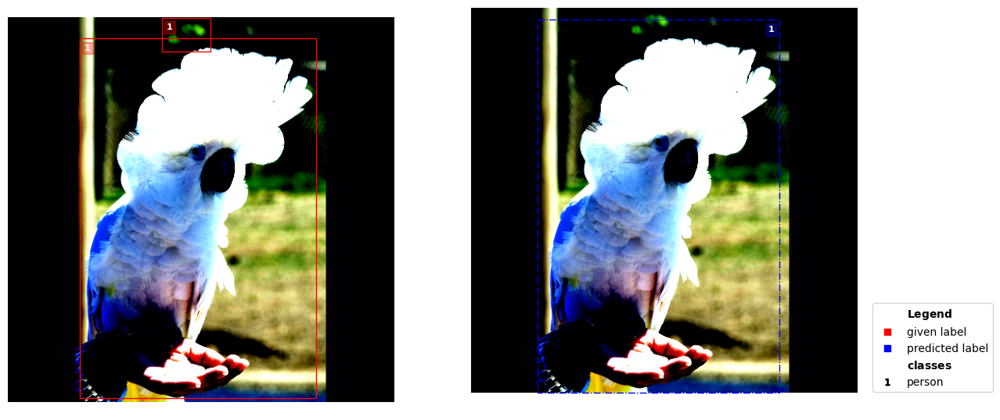

/workspace/yolo_v8_training/oiv7_full/validation/0ee131f55fb5b7f2.jpg | idx 165 | label quality score: 0.2789872559308131 | is issue: True


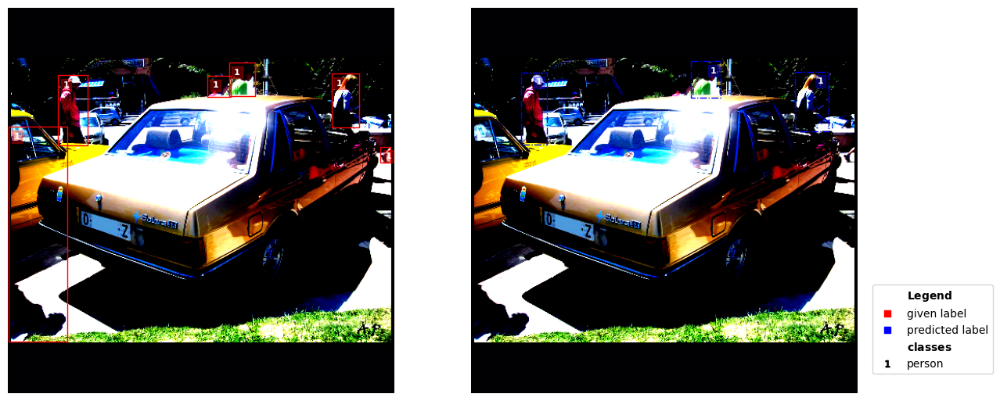

/workspace/yolo_v8_training/oiv7_full/validation/06bc010875dc40cb.jpg | idx 16 | label quality score: 0.2968804411528418 | is issue: True


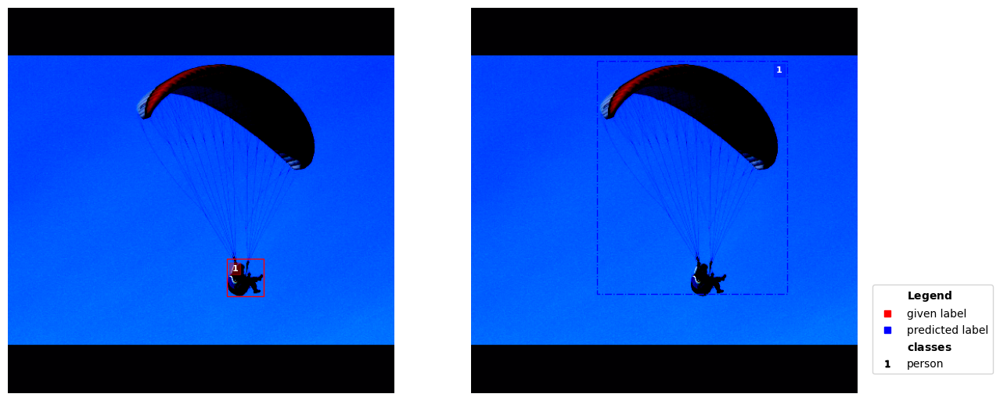

/workspace/yolo_v8_training/oiv7_full/validation/0e5fee84637d75f5.jpg | idx 52 | label quality score: 0.3024476292065005 | is issue: True


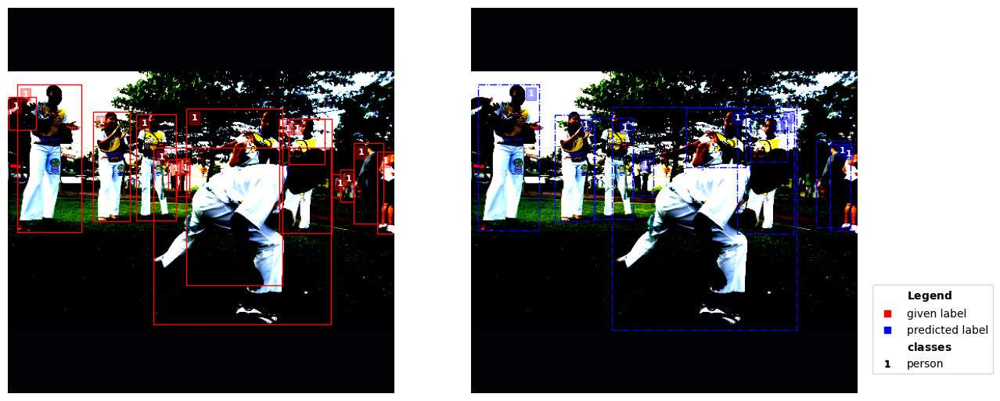

/workspace/yolo_v8_training/oiv7_full/validation/10fb570420734d6c.jpg | idx 70 | label quality score: 0.3249850676670502 | is issue: True


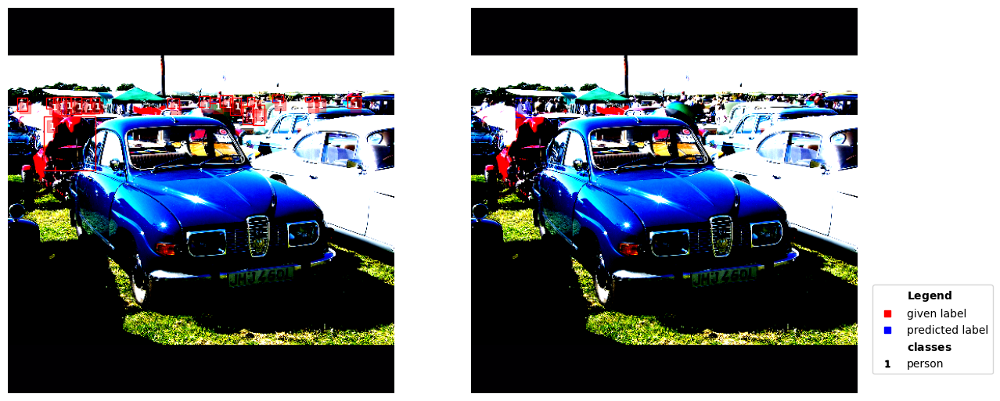

/workspace/yolo_v8_training/oiv7_full/validation/0c3faec726e97005.jpg | idx 11 | label quality score: 0.3381641706520262 | is issue: True


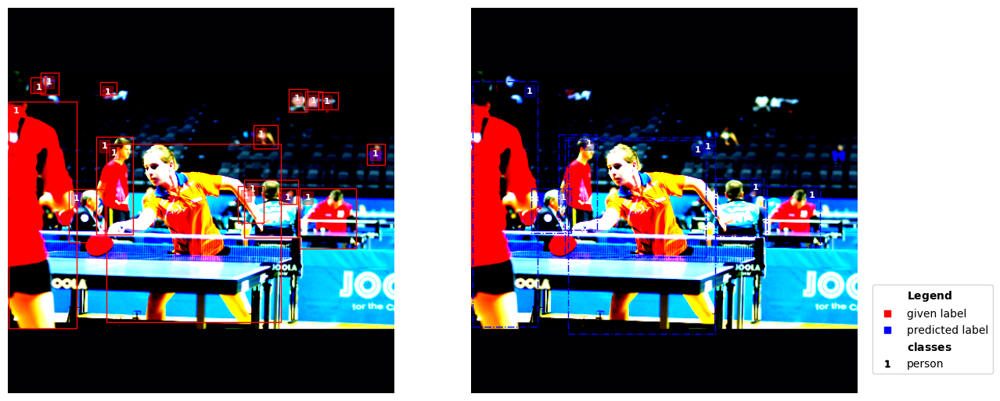

In [261]:
class_names = {"1": "person"}
IMAGE_PATH = '/workspace/yolo_v8_training/oiv7_full/validation/'

for i in range(10):  # iterate from 0 to 9 (inclusive)
    issue_to_visualize = issue_idx[i]  # use the index variable i
    
    label = labels[issue_to_visualize]
    prediction = predictions[issue_to_visualize]
    score = scores[issue_to_visualize]
    image_path = IMAGE_PATH + label['seg_map']
    
    print(image_path, '| idx', issue_to_visualize, '| label quality score:', score, '| is issue: True')
    
    visualize(label['img'], label=label, prediction=prediction, class_names=class_names, overlay=False)